# **Liver Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of sex-specific differences in the liver.


# **Imports**

In [66]:
# import the VAE code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [67]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_liver_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/liver_sex/"
reference_data_path = f"{os.getcwd()}/../data/reference_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_liver/"

de_genes_path = f"{os.getcwd()}/../data/single_cell_data/liver_sex/de_pseudobulk_results.pkl"
de_bulk_path = f"{os.getcwd()}/../data/bulk_data/liver_sex/de_real_bulk_results.pkl"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_liver/"


cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_liver/" +
                        "CIBERSORTx_Job20_all-liver_0_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job20_all-liver_0_cybersort_sig_inferred_refsample.bm.K999.txt")


num_genes = 7000

exp_id = "all-liver"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = False


# Set-up experimental variables

In [68]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of pseudobulks
n_pseudobulk_rand = 1000
n_pseudobulk_ct = 800


# number of patients/domains/samples expected
n_tot_samples = 51 # 51 bulk and single cell samples

# number of drugs (in this case sexes used for prediction)
# one-hot encoded
n_drugs = 2

# number of types of sequencing (one-hot encoded)
n_tech = 2

# experiment id
lab_file_name = exp_id


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [69]:
# get the info for CIBERSORT for generating the union_genes

if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_liver_pseudobulk_file(sc_aug_data_path, "1-M-63", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_df = pseudobulks_df.transpose()
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)



In [70]:
in_name = "liver_bulk_processed"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in male first
sample_order = ['30-M-5']

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id, n_pseudobulk_rand, n_pseudobulk_ct)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# now read in female
sample_order = ['18-F-51']
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "STIM", "Test", exp_id, n_pseudobulk_rand, n_pseudobulk_ct)
    pseudobulks_df.columns = gene_df

    X_concat = pd.concat([X_concat, pseudobulks_df])
    Y_concat = pd.concat([Y_concat, prop_df])
    meta_concat = pd.concat([meta_concat, metadata_df])



# read in the bulk data
real_bulk_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)


# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(15)]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])



30-M-5
18-F-51


<ipython-input-70-7112eb150973>:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["isTraining"] = "Train"
<ipython-input-70-7112eb150973>:56: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_bulk_meta_df["cell_prop_type"] = "realistic"
<ipython-input-70-7112eb150973>:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [71]:
pseudobulks_df

gene_ids,Sox17,Mrpl15,Lypla1,Tcea1,Atp6v1h,Rb1cc1,Pcmtd1,Sntg1,Rrs1,Adhfe1,...,G530011O06Rik,Vamp7,Tmlhe,Zf12,Kdm5d,Eif2s3y,Uty,Ddx3y,LOC380994,Erdr1
0,8.0,2637.0,4186.0,1339.0,1213.0,653.0,2474.0,0.0,645.0,849.0,...,14.0,923.0,30.0,1.0,0.0,0.0,0.0,0.0,0.0,1122.0
0,31.0,772.0,1732.0,1972.0,874.0,253.0,1342.0,0.0,981.0,21.0,...,102.0,580.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,1661.0
0,188.0,1471.0,1746.0,3528.0,1086.0,1073.0,1570.0,0.0,807.0,7.0,...,259.0,760.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2150.0
0,6.0,1042.0,1201.0,2207.0,1512.0,940.0,1159.0,0.0,303.0,40.0,...,319.0,466.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,1383.0
0,925.0,997.0,1444.0,2708.0,1037.0,1253.0,1771.0,0.0,625.0,5.0,...,319.0,909.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1228.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,121.0,2119.0,1315.0,4441.0,1518.0,1111.0,973.0,0.0,951.0,2.0,...,454.0,485.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2594.0
0,130.0,2294.0,1265.0,4247.0,1497.0,1013.0,881.0,0.0,1003.0,0.0,...,543.0,517.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2528.0
0,145.0,1993.0,1495.0,3873.0,1378.0,999.0,1103.0,0.0,901.0,48.0,...,414.0,567.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2306.0
0,119.0,2157.0,1285.0,4275.0,1493.0,1034.0,946.0,0.0,979.0,8.0,...,494.0,526.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2549.0


In [72]:
cibersort_bulk = real_bulk_df
cibersort_bulk = cibersort_bulk.transpose()
cibersort_bulk.columns


Index(['Liver_56', 'Liver_46', 'Liver_8', 'Liver_14', 'Liver_9', 'Liver_39',
       'Liver_32', 'Liver_25', 'Liver_26', 'Liver_6', 'Liver_13', 'Liver_27',
       'Liver_45', 'Liver_11', 'Liver_28', 'Liver_43', 'Liver_44', 'Liver_33',
       'Liver_36', 'Liver_53', 'Liver_34', 'Liver_52', 'Liver_10', 'Liver_49',
       'Liver_18', 'Liver_40', 'Liver_12', 'Liver_47', 'Liver_22', 'Liver_29',
       'Liver_48', 'Liver_23', 'Liver_17', 'Liver_4', 'Liver_24', 'Liver_1',
       'Liver_50', 'Liver_19', 'Liver_21', 'Liver_38', 'Liver_42', 'Liver_3',
       'Liver_20', 'Liver_16', 'Liver_7', 'Liver_35', 'Liver_2', 'Liver_5',
       'Liver_31'],
      dtype='object', name='sample_id')

In [92]:
# get the info for CIBERSORT for generating the union_genes

if RUN_CIBERSORT_SAMPLES: 
    _, _, _, sig_df, _ = sc_preprocess.read_single_liver_pseudobulk_file(sc_aug_data_path, "30-M-5", "CTRL", "Train", exp_id)

    # now we format the real bulks
    cibersort_bulk = real_bulk_df
    cibersort_bulk = cibersort_bulk.transpose()

    # now write it out
    sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, cibersort_bulk, patient_idx=99)



In [93]:
sig_df

gene_ids,scpred_CellType,Sox17,Mrpl15,Lypla1,Tcea1,Atp6v1h,Rb1cc1,Pcmtd1,Sntg1,Rrs1,...,G530011O06Rik,Vamp7,Tmlhe,Zf12,Kdm5d,Eif2s3y,Uty,Ddx3y,LOC380994,Erdr1
0,hepatocyte,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,hepatocyte,0.0,3.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,hepatocyte,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,hepatocyte,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,hepatocyte,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1055,NK,0.0,0.0,1.0,2.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1056,b_cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1057,b_cell,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1058,b_cell,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:
meta_df.sample_id.value_counts()

30-M-5      1800
18-F-51     1800
Liver_5        1
Liver_2        1
Liver_40       1
Liver_12       1
Liver_47       1
Liver_22       1
Liver_29       1
Liver_48       1
Liver_23       1
Liver_17       1
Liver_4        1
Liver_24       1
Liver_1        1
Liver_18       1
Liver_19       1
Liver_21       1
Liver_38       1
Liver_42       1
Liver_3        1
Liver_20       1
Liver_16       1
Liver_7        1
Liver_35       1
Liver_50       1
Liver_49       1
Liver_10       1
Liver_52       1
Liver_56       1
Liver_46       1
Liver_8        1
Liver_14       1
Liver_9        1
Liver_39       1
Liver_32       1
Liver_25       1
Liver_26       1
Liver_6        1
Liver_13       1
Liver_27       1
Liver_45       1
Liver_11       1
Liver_28       1
Liver_43       1
Liver_44       1
Liver_33       1
Liver_36       1
Liver_53       1
Liver_34       1
Liver_31       1
Name: sample_id, dtype: int64

In [76]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type
0,30-M-5,CTRL,Train,random,sc_ref
1,30-M-5,CTRL,Train,random,sc_ref
2,30-M-5,CTRL,Train,random,sc_ref
3,30-M-5,CTRL,Train,random,sc_ref
4,30-M-5,CTRL,Train,random,sc_ref
...,...,...,...,...,...
Liver_7,Liver_7,CTRL,Train,realistic,bulk
Liver_35,Liver_35,CTRL,Train,realistic,bulk
Liver_2,Liver_2,STIM,Train,realistic,bulk
Liver_5,Liver_5,CTRL,Train,realistic,bulk


In [77]:
X_full

,0610005C13Rik,0610009B22Rik,0610009L18Rik,0610010F05Rik,0610010K14Rik,0610012G03Rik,0610030E20Rik,0610031O16Rik,0610037L13Rik,0610038B21Rik,...,Zwilch,Zwint,Zxda,Zxdb,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,a
0,872.0,1405.0,39.0,1092.0,3838.0,7423.0,3155.0,35.0,2006.0,0.0,...,142.0,1247.0,610.0,53.0,267.0,1599.0,6963.0,1099.0,990.0,11.0
0,2450.0,2258.0,31.0,874.0,3301.0,5619.0,2492.0,143.0,1676.0,0.0,...,206.0,1093.0,436.0,45.0,234.0,976.0,9557.0,705.0,1023.0,11.0
0,1764.0,1915.0,64.0,318.0,3830.0,4682.0,1443.0,94.0,1877.0,0.0,...,32.0,789.0,527.0,253.0,421.0,1256.0,6009.0,1484.0,964.0,0.0
0,9498.0,3662.0,3.0,665.0,2384.0,6272.0,1091.0,534.0,1304.0,0.0,...,147.0,581.0,250.0,14.0,317.0,900.0,2533.0,376.0,645.0,3.0
0,3970.0,2048.0,56.0,510.0,2581.0,5306.0,1094.0,193.0,1191.0,0.0,...,235.0,393.0,404.0,34.0,464.0,1029.0,4203.0,600.0,694.0,24.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Liver_7,7.0,56.0,19.0,221.0,111.0,183.0,107.0,14.0,446.0,7.0,...,94.0,625.0,0.0,62.0,369.0,379.0,2161.0,818.0,921.0,1.0
Liver_35,3098.0,258.0,2.0,436.0,17.0,512.0,145.0,920.0,302.0,0.0,...,19.0,1567.0,0.0,36.0,432.0,682.0,931.0,544.0,625.0,4.0
Liver_2,0.0,4.0,0.0,28.0,6.0,4.0,8.0,3.0,62.0,2.0,...,2.0,13.0,0.0,3.0,24.0,18.0,35.0,64.0,62.0,0.0
Liver_5,6.0,52.0,7.0,43.0,11.0,80.0,13.0,0.0,69.0,0.0,...,1.0,68.0,0.0,11.0,30.0,64.0,180.0,97.0,77.0,0.0


# Define indices and set-up metadata

In [78]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)



# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -6455)[-6455:] # num_genes to get 7000
gene_df = gene_df.iloc[idx_top]


# Make sure our test/train indicies are correct

We want to make sure there are no Female single cell mice in our training data.

In [79]:
np.unique(Bulk_full,  return_counts=True)

(array([0, 1]), array([  49, 3600]))

In [80]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,18-F-51,30-M-5,Liver_1,Liver_10,Liver_11,Liver_12,Liver_13,Liver_14,Liver_16,Liver_17,...,Liver_49,Liver_5,Liver_50,Liver_52,Liver_53,Liver_56,Liver_6,Liver_7,Liver_8,Liver_9
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sc_ref,1800.0,1800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Test,NaN,1800.0
Train,49.0,1800.0


In [82]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,1835,14


In [83]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,49,1800


# compare our variable genes with cibersort defined genes

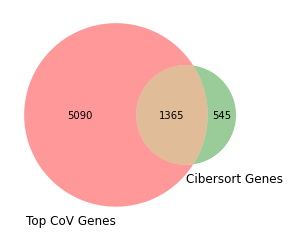

In [84]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [85]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

# Normalize data

In [86]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


# Plot all data

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3649 samples in 0.026s...
[t-SNE] Computed neighbors for 3649 samples in 0.819s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3649
[t-SNE] Computed conditional probabilities for sample 2000 / 3649
[t-SNE] Computed conditional probabilities for sample 3000 / 3649
[t-SNE] Computed conditional probabilities for sample 3649 / 3649
[t-SNE] Mean sigma: 1.174938
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.474976
[t-SNE] KL divergence after 500 iterations: 0.974959
(3649, 2)
(3649, 2)


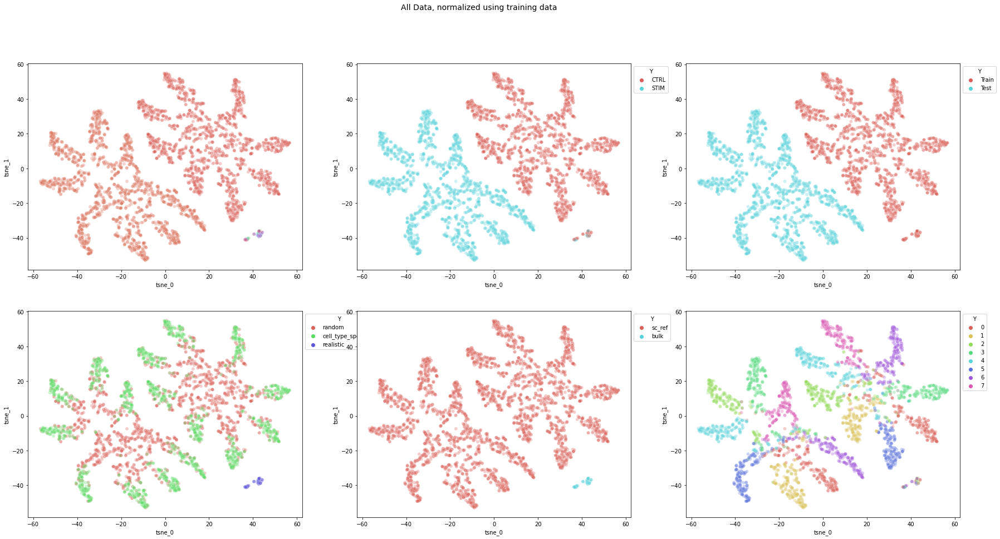

In [87]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(49, 2)
(49, 2)


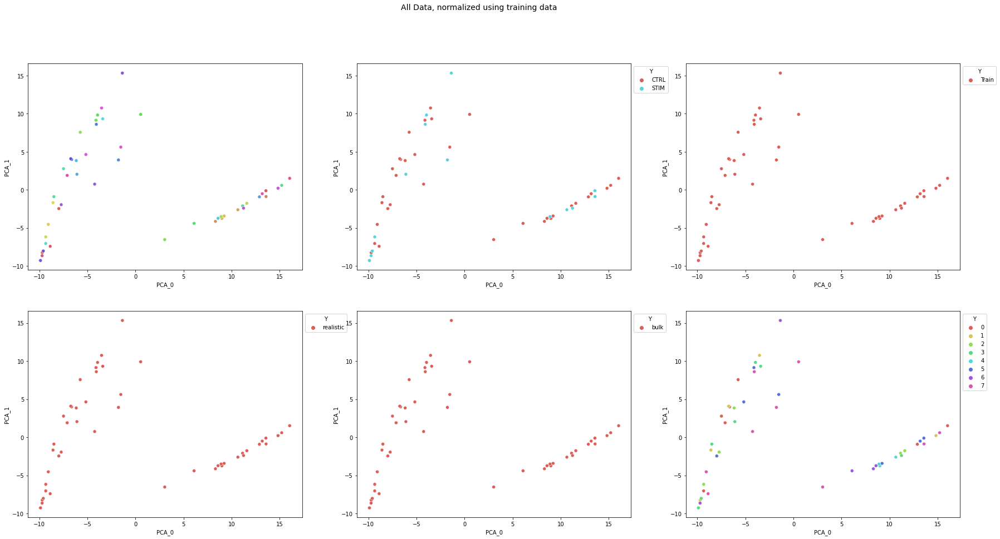

In [88]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 48 nearest neighbors...
[t-SNE] Indexed 49 samples in 0.000s...
[t-SNE] Computed neighbors for 49 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 49 / 49
[t-SNE] Mean sigma: 9.846084
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.207596


[t-SNE] KL divergence after 500 iterations: 0.396950
(49, 2)
(49, 2)


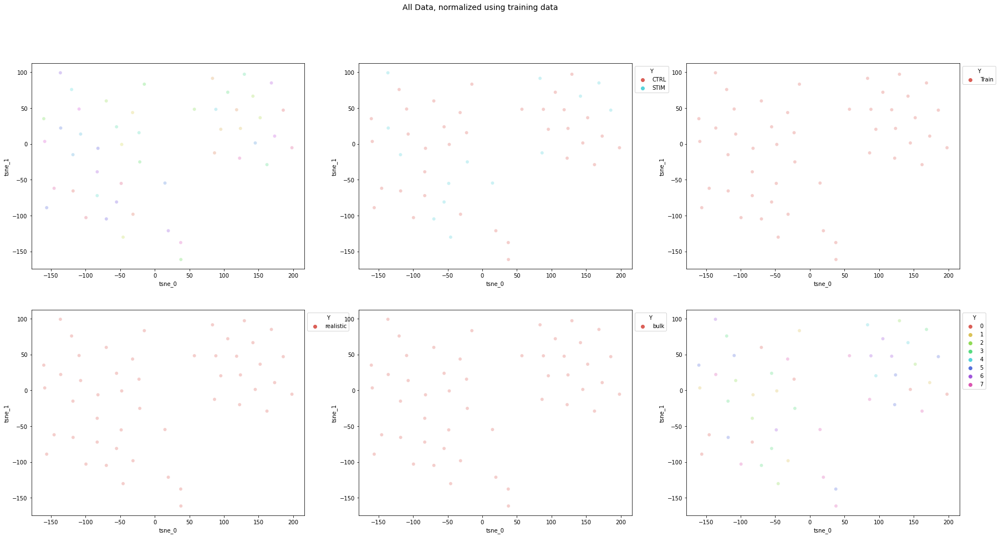

In [89]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  112.01005244255066
Epoch:  49


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_100_all-liver_classifier/assets


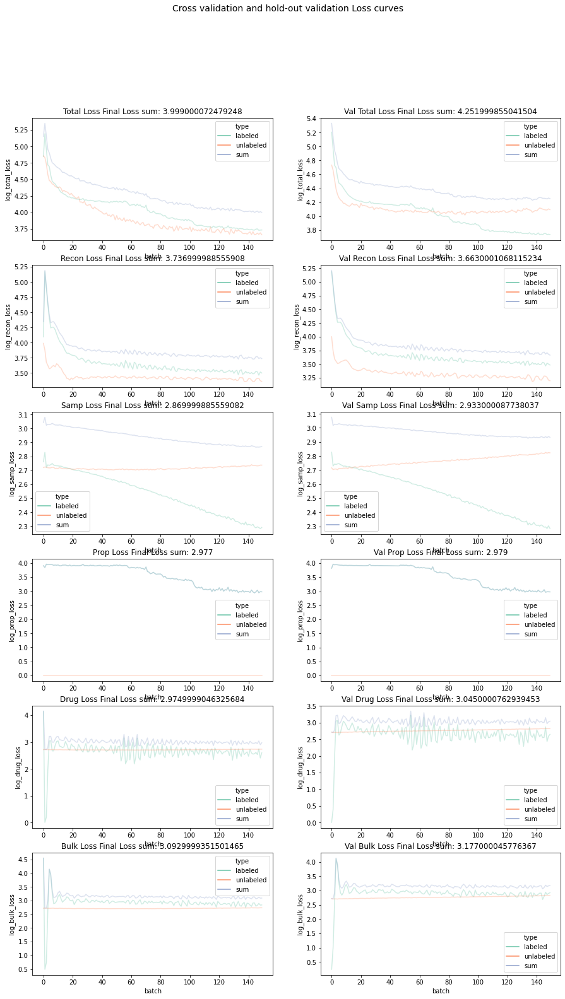

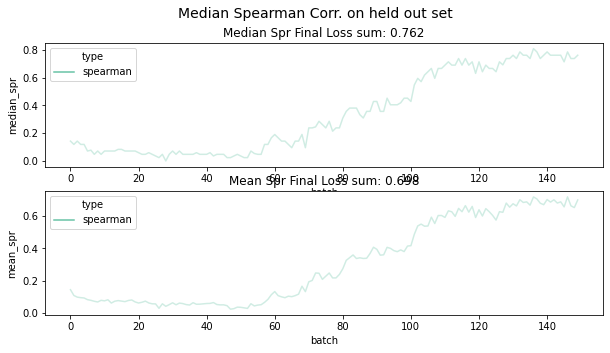

In [94]:
curr_n_epoch=50
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 50 1000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  100.8107533454895
Epoch:  49


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_1000_all-liver_classifier/assets


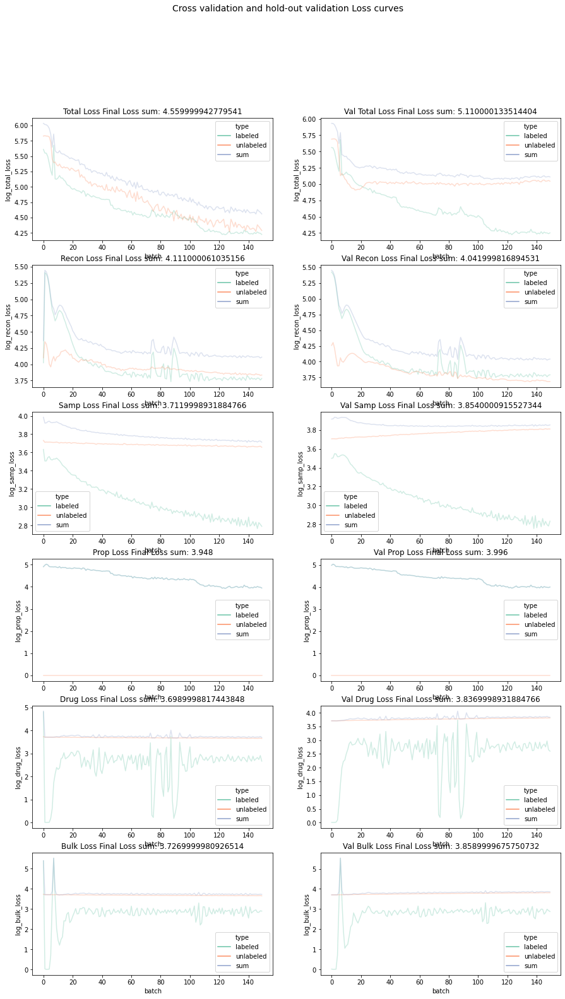

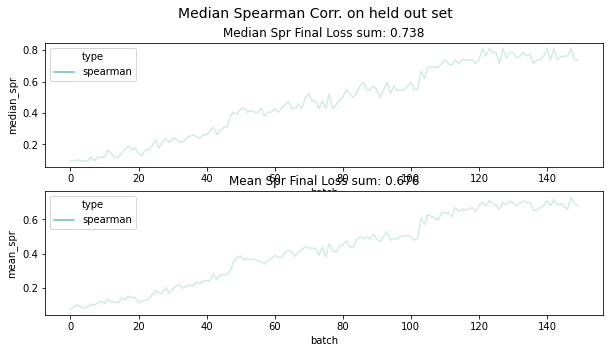

In [95]:
curr_n_epoch=50
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


### 50 10000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  106.57019448280334
Epoch:  49


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//50_10000_all-liver_classifier/assets


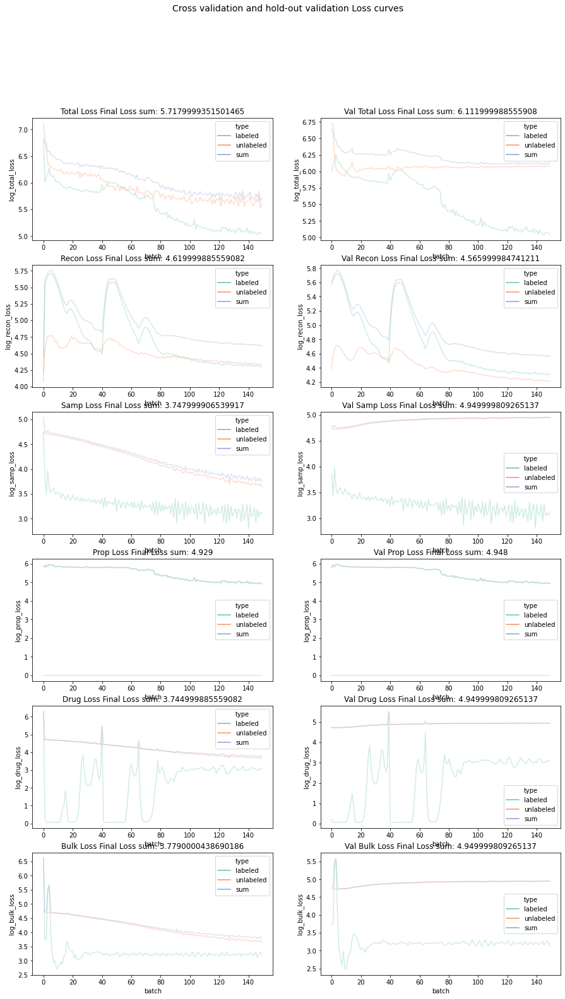

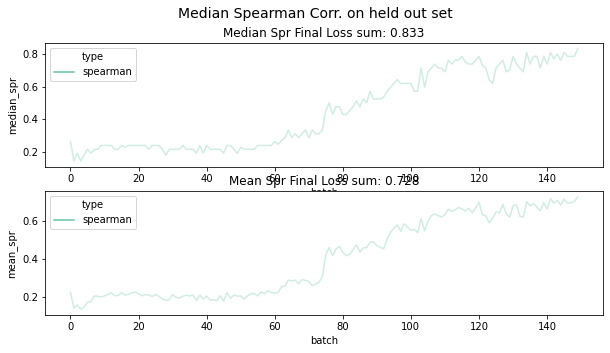

In [96]:
curr_n_epoch=50
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 100

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  207.0626356601715
Epoch:  99


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_100_all-liver_classifier/assets


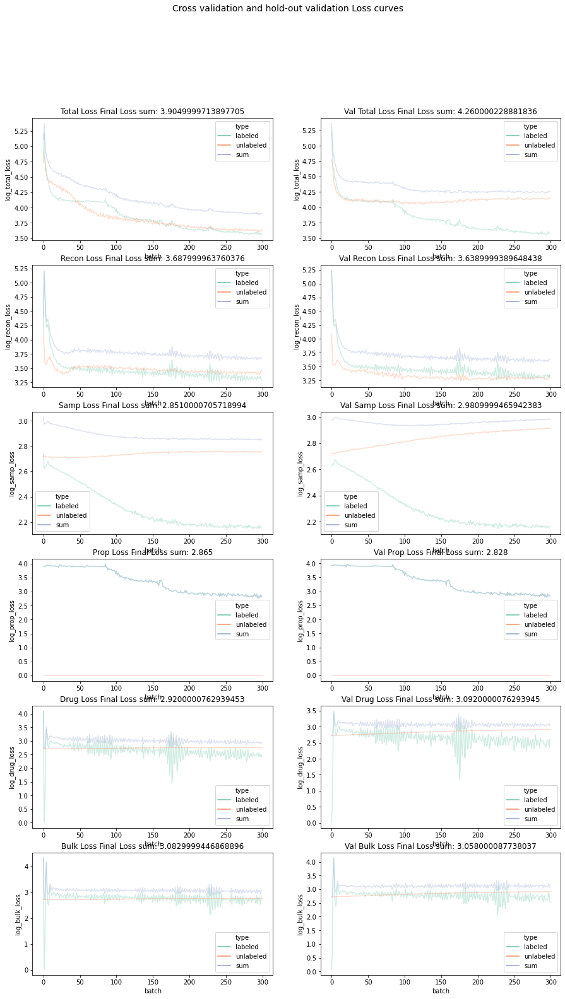

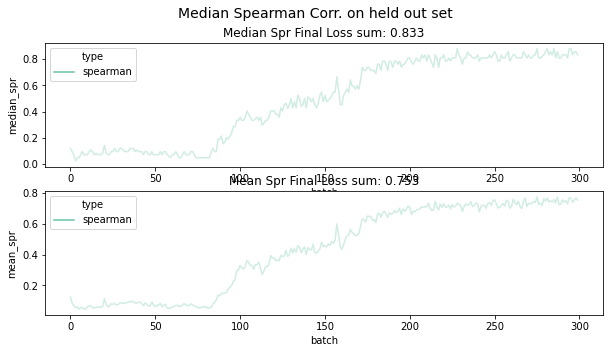

In [97]:
curr_n_epoch=100
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 1000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  212.16146278381348
Epoch:  99


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_1000_all-liver_classifier/assets


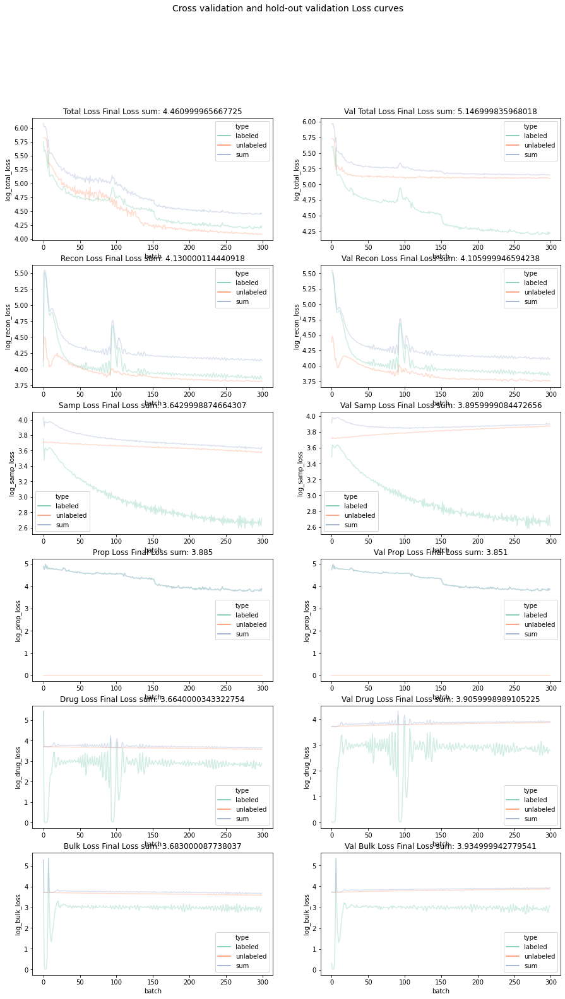

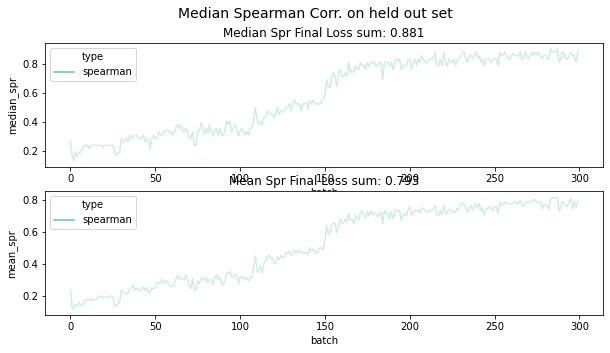

In [98]:
curr_n_epoch=100
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 10000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  206.88913321495056
Epoch:  99


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//100_10000_all-liver_classifier/assets


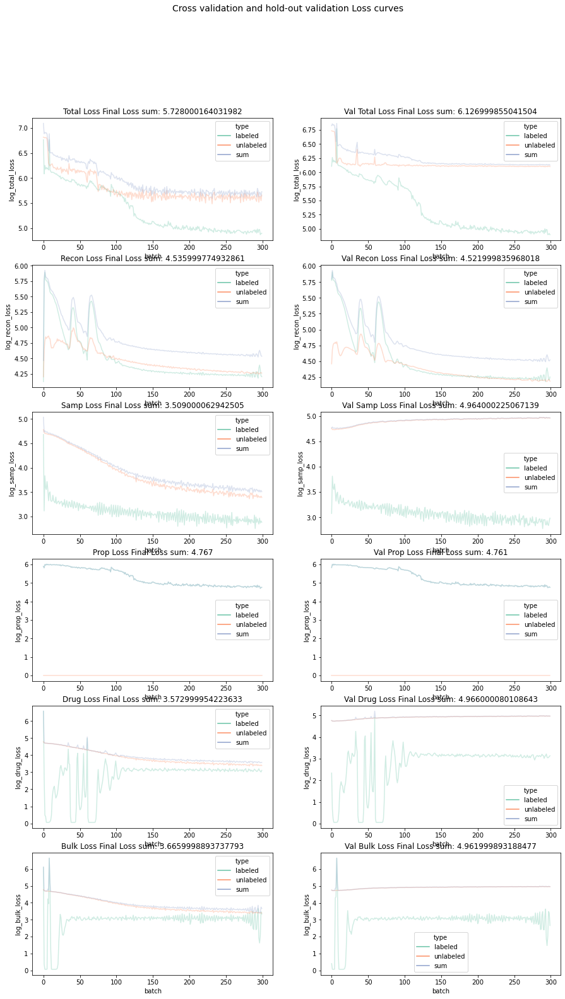

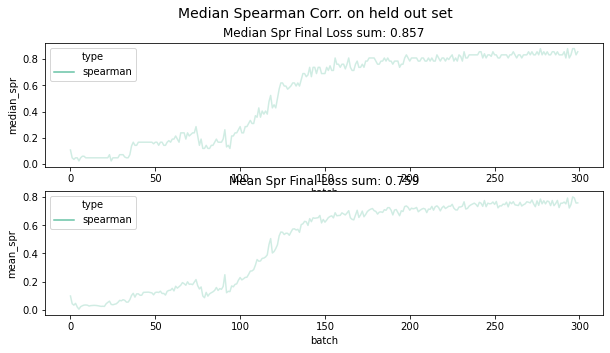

In [99]:
curr_n_epoch=100
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 100

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  412.6289052963257
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_100_all-liver_classifier/assets


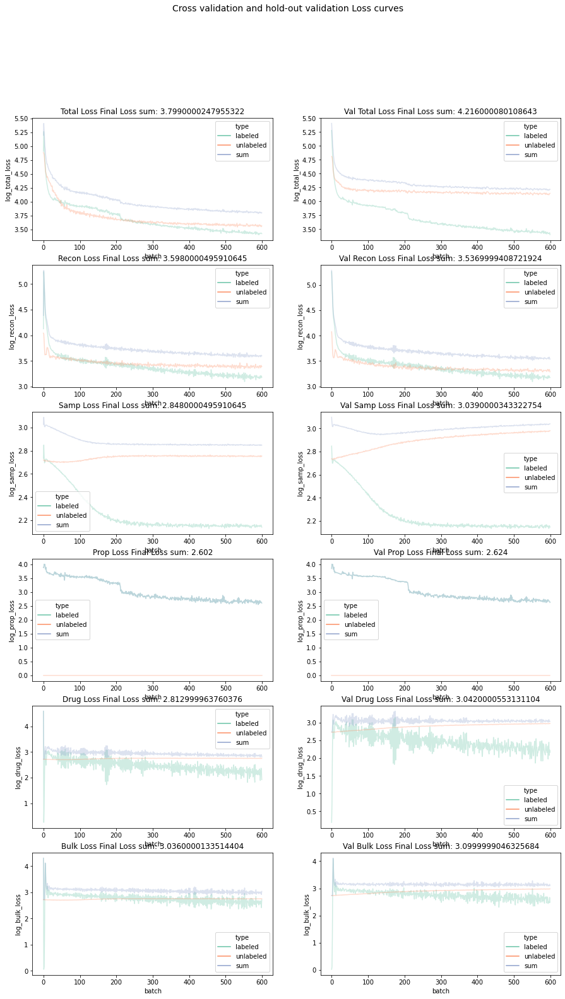

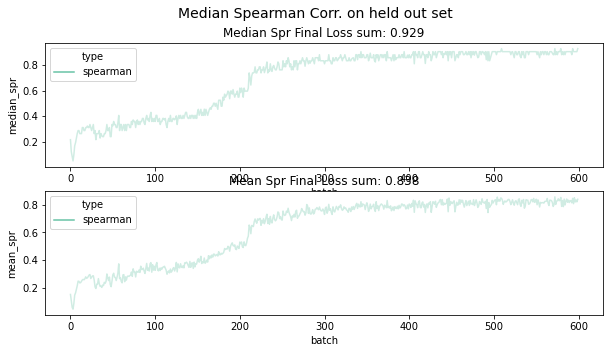

In [100]:
curr_n_epoch=200
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 1000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  383.4863736629486
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_1000_all-liver_classifier/assets


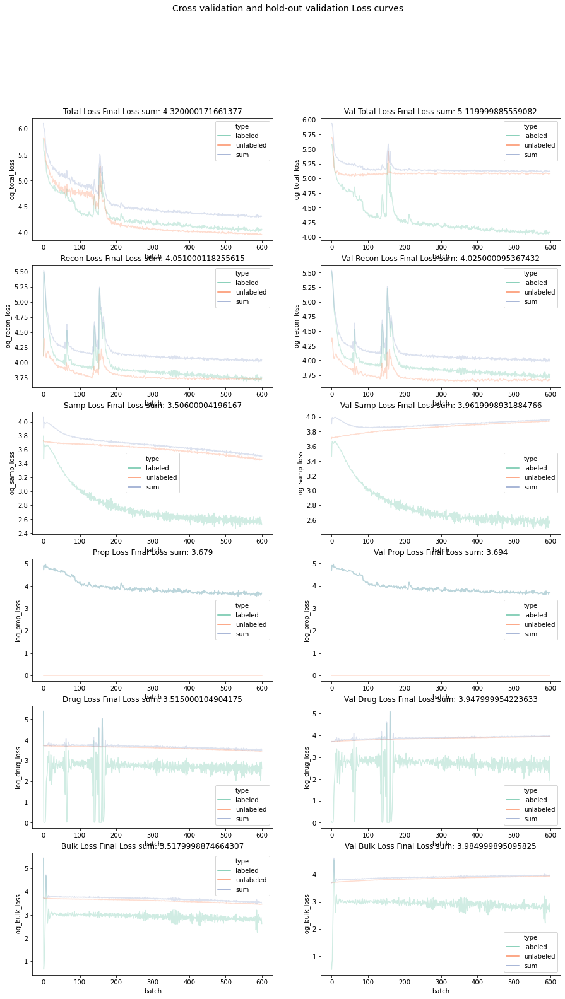

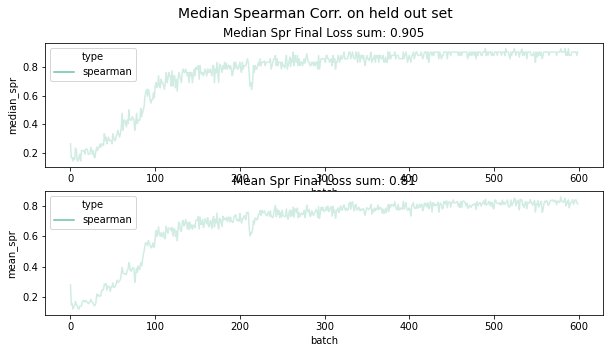

In [101]:
curr_n_epoch=200
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 10000

test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  386.74530959129333
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//200_10000_all-liver_classifier/assets


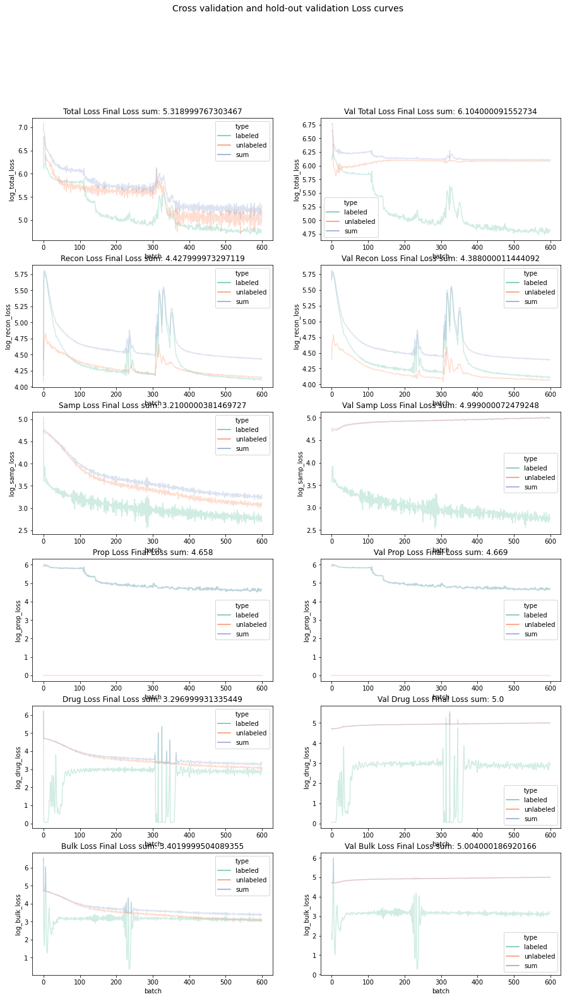

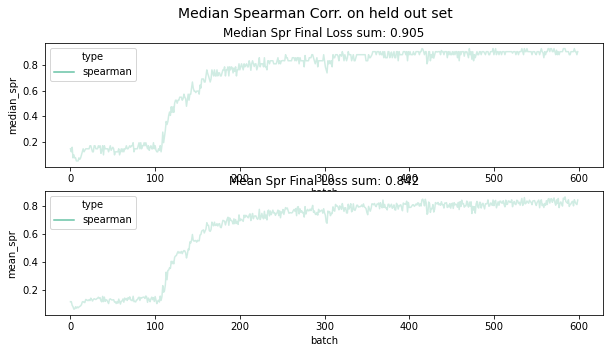

In [102]:
curr_n_epoch=200
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt)

curr_exp_id = f"{curr_n_epoch}_{curr_wt}_{exp_id}"
res = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

In [103]:
res

BuddiTrainResults(known_prop_vae=<keras.engine.functional.Functional object at 0x7f35574c0100>, unknown_prop_vae=<keras.engine.functional.Functional object at 0x7f3558947f40>, encoder_unlab=<keras.engine.functional.Functional object at 0x7f3558947cd0>, encoder_lab=<keras.engine.functional.Functional object at 0x7f3550474610>, decoder=<keras.engine.functional.Functional object at 0x7f35560d34c0>, classifier=<keras.engine.functional.Functional object at 0x7f354f8d2970>, loss_fig=<Figure size 1080x1800 with 12 Axes>, spr_fig=<Figure size 720x360 with 2 Axes>, output_folder='/beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver/')

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 3.7 | 3.62 | **3.54** |
| 1000 | 4.17 | 4.35 | 3.65 |
| 10000 | 4.56 | 4.97 | 4.4 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.36 | 0.69 | 0.82 |
| 1000 | 0.50 | 0.76 | 0.77 |
| 10000 | 0.66 | 0.56 | **0.85** |


test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  426.502480506897
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model1_all-liver_classifier/assets


test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  393.3721225261688
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model2_all-liver_classifier/assets


test_size_samp: 500
train_size_samp: 1500


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


Elapsed:  408.83552169799805
Epoch:  199


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_known_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_encoder_unlab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_encoder_lab/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_decoder/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_classifier/assets


INFO:tensorflow:Assets written to: /beevol/home/davidson/checkouts/sc_bulk_ood/liver_analysis/../results/single_cell_data/buddiM2_liver//model3_all-liver_classifier/assets


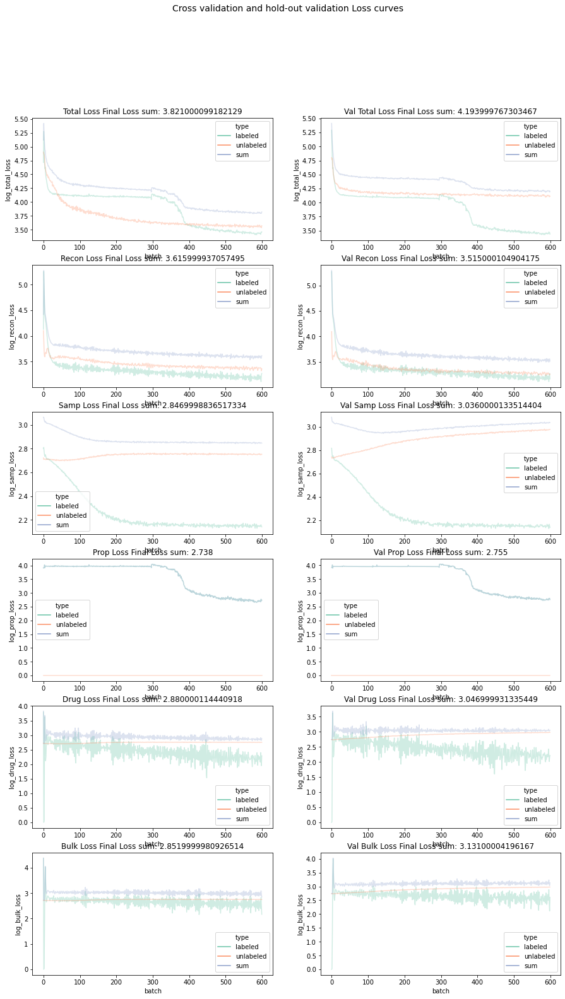

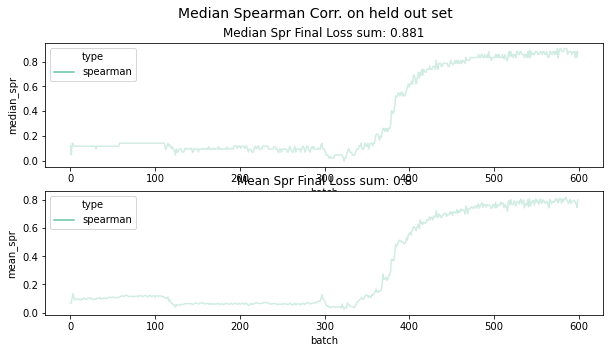

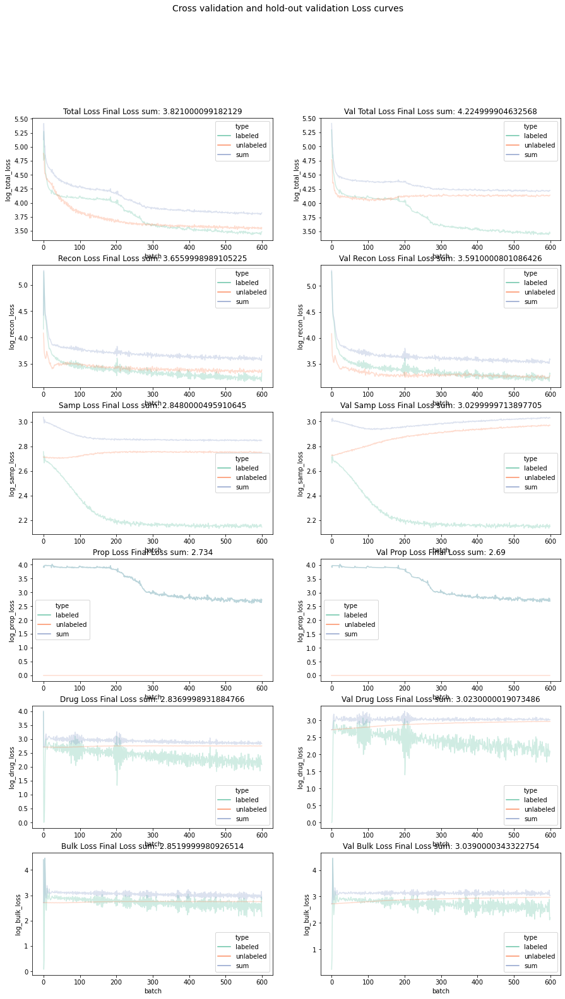

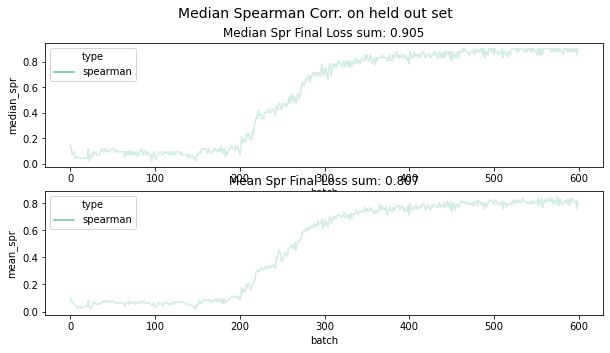

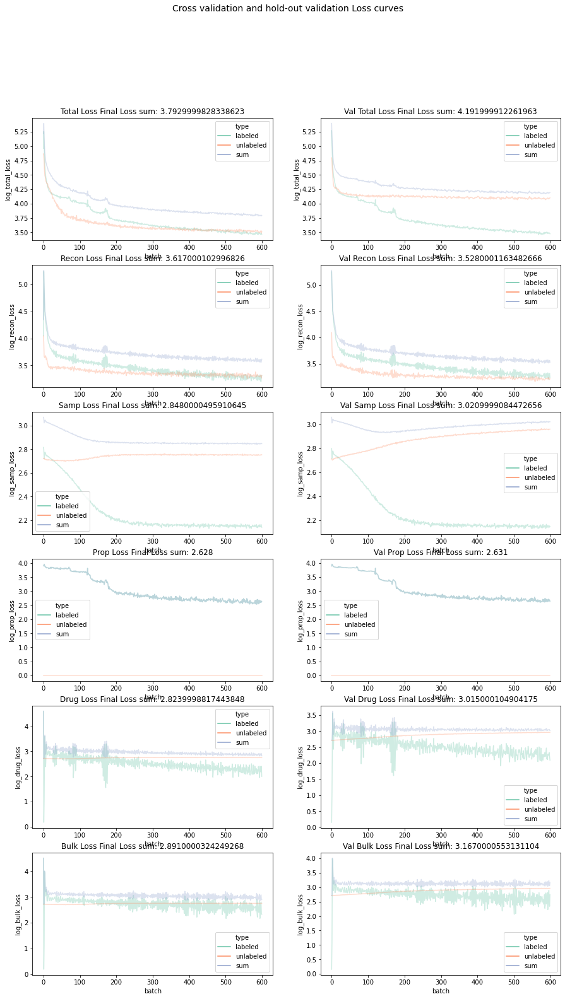

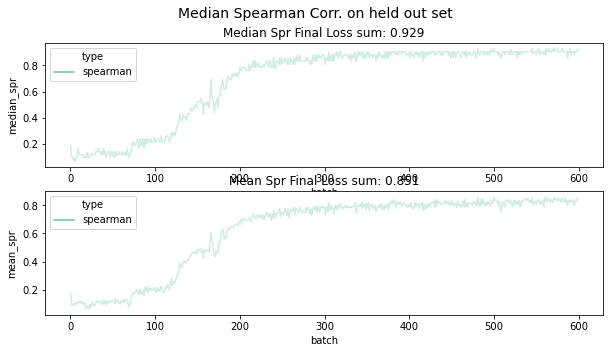

In [104]:
curr_n_epoch=200
curr_wt = 100

if True: # RETRAIN_MODELS


    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=curr_wt, alpha_prop=curr_wt, 
                alpha_bulk=curr_wt, alpha_drug=curr_wt)

    ## model 1
    curr_exp_id = f"model1_{exp_id}"
    res1 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_exp_id = f"model2_{exp_id}"
    res2 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_exp_id = f"model3_{exp_id}"
    res3 = buddi.train_buddi(res_data_path, curr_exp_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/model1_{exp_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/model2_{exp_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/model3_{exp_id}_classifier")

## visualize latent spaces

### subset data

In [105]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


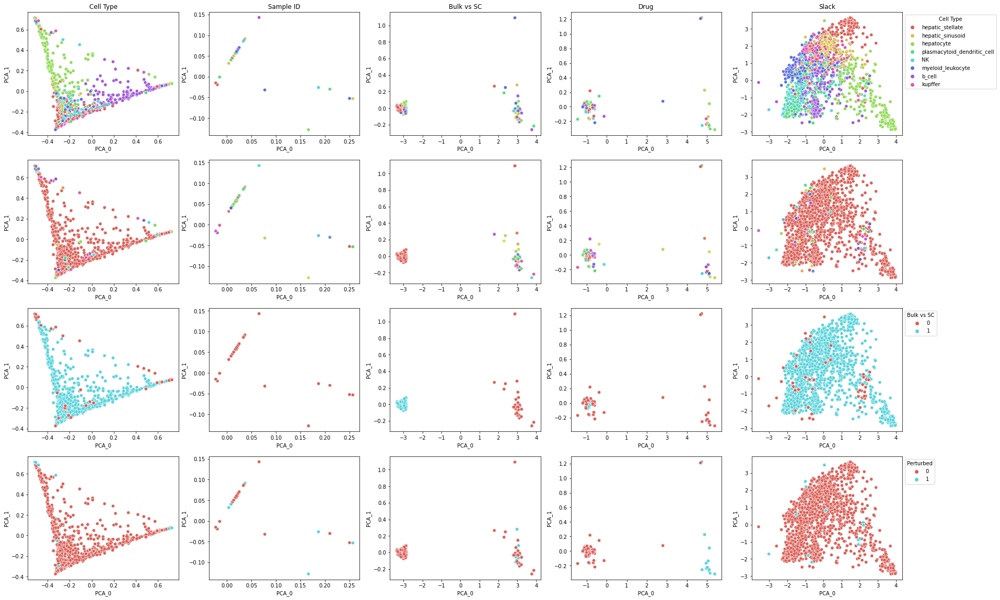

In [106]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


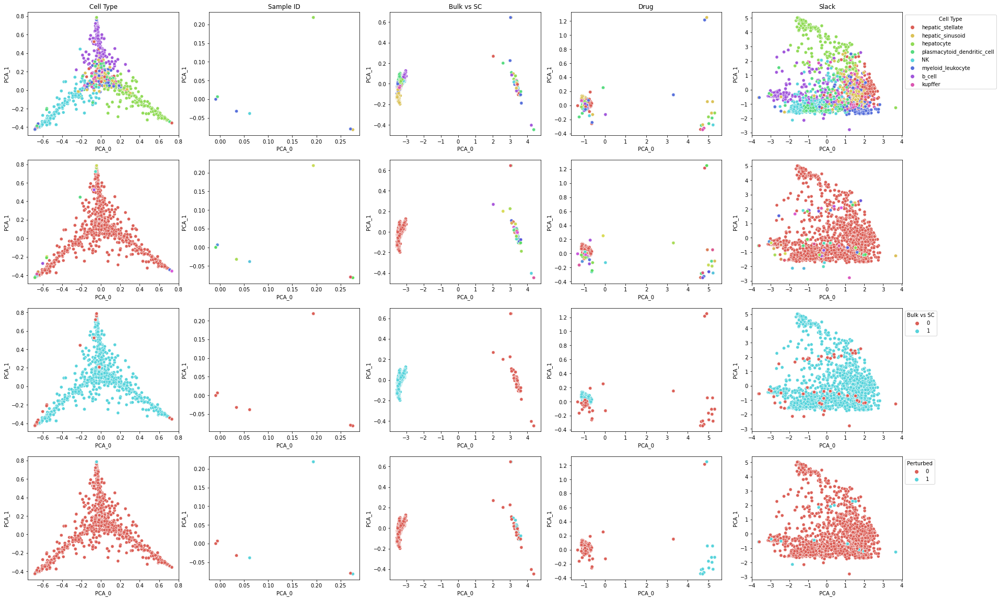

In [107]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


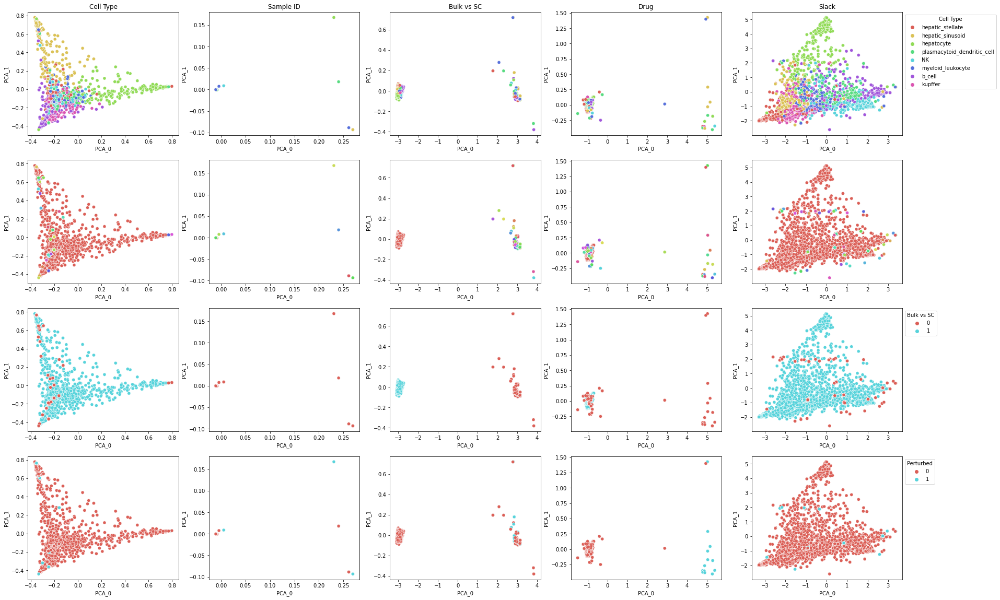

In [108]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


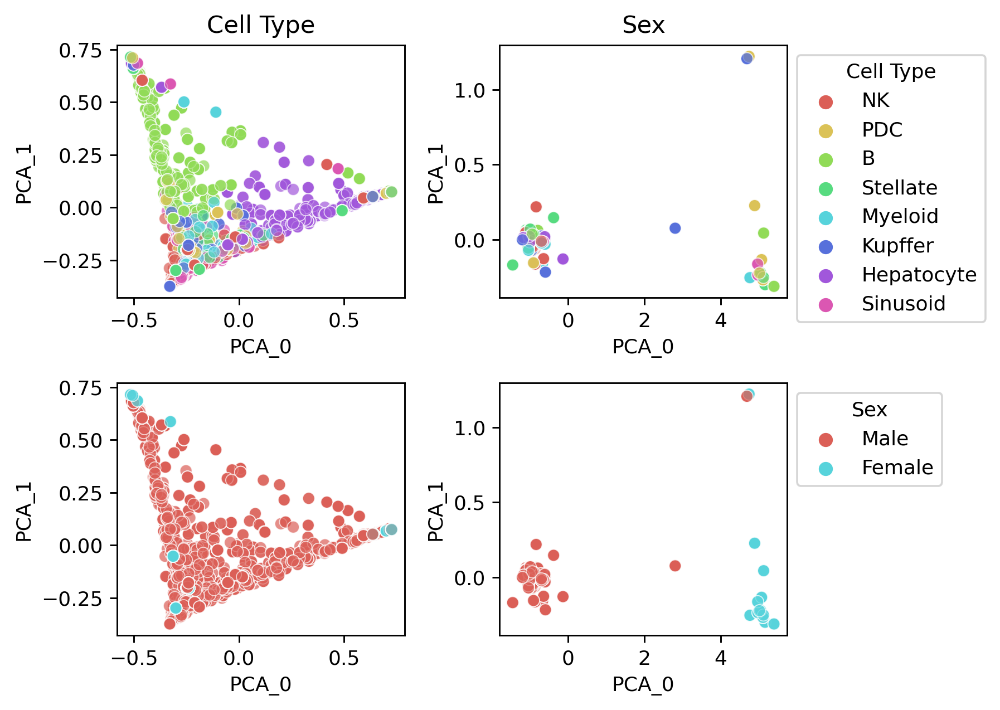

In [109]:

z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = res1_enc_unlab.predict(X_temp, batch_size=500)
prop_outputs = res1_classifier.predict(X_temp, batch_size=500)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])


# format
perturb_temp_str = ["Female" if x else "Male" for x in perturb_temp]

fig, axs = plt.subplots(2, 2, figsize=(7,5), dpi=260)

alpha=0.7
plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=perturb_temp_str, ax=axs[1,0], title="", alpha=alpha, legend_title="Sex")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sex", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=perturb_temp_str, ax=axs[1,1], title="", alpha=alpha, legend_title="Sex")

count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        if inner_count_idx < 1:
            ax2.get_legend().remove()
        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1

legend_handles, _= axs[0,1].get_legend_handles_labels()
axs[0,1].legend(legend_handles, ["NK", "PDC", "B", "Stellate", "Myeloid", "Kupffer", "Hepatocyte", "Sinusoid"], title="Cell Type")
sns.move_legend(axs[0,1], "upper left", bbox_to_anchor=(1, 1))

fig.tight_layout()


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


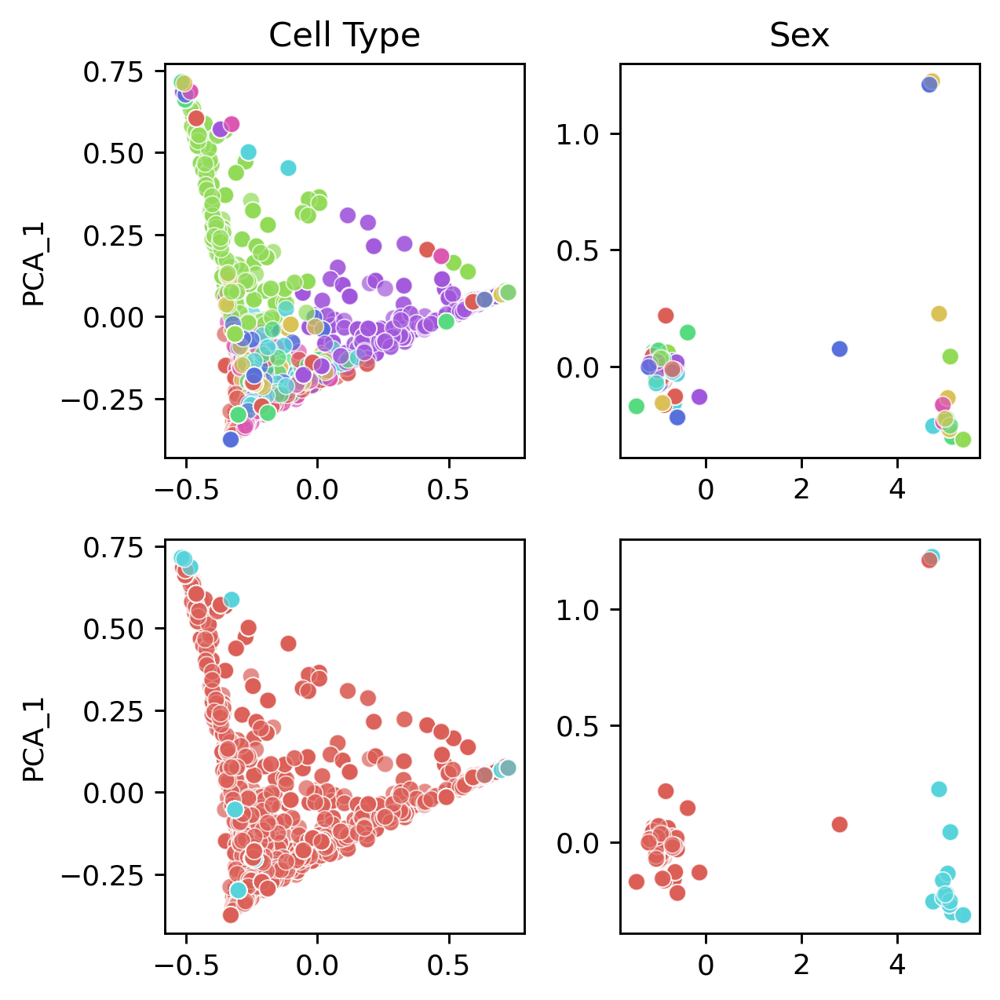

In [110]:

z_slack, mu_slack, _, z_rot, mu_rot, _, z_drug, mu_drug, _, z_bulk, mu_bulk, _ = res1_enc_unlab.predict(X_temp, batch_size=500)
prop_outputs = res1_classifier.predict(X_temp, batch_size=500)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug, z_bulk])


# format
perturb_temp_str = ["Female" if x else "Male" for x in perturb_temp]

fig, axs = plt.subplots(2, 2, figsize=(5,5), dpi=260)

alpha=0.7
plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell Type", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=perturb_temp_str, ax=axs[1,0], title="", alpha=alpha, legend_title="Sex")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,1], title="Sex", alpha=alpha, legend_title="Cell Type")
vp.plot_pca(plot_df, color_vec=perturb_temp_str, ax=axs[1,1], title="", alpha=alpha, legend_title="Sex")



count_idx = 0
for ax1 in axs:
    inner_count_idx = 0
    for ax2 in ax1:
        x_axis = ax2.axes.get_xaxis()
        y_axis = ax2.axes.get_yaxis()
        ax2.get_legend().remove()

        if inner_count_idx != 0:
            y_label = y_axis.get_label()
            y_label.set_visible(False)

        if count_idx < 2:
            x_label = x_axis.get_label()
            x_label.set_visible(False)

        inner_count_idx = inner_count_idx + 1

    count_idx = count_idx + 1

fig.tight_layout()


## visualize reconstruction

### subset data

In [111]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type == "cell_type_specific", meta_df.isTraining == "Test"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


(2000, 2)
(2000, 2)


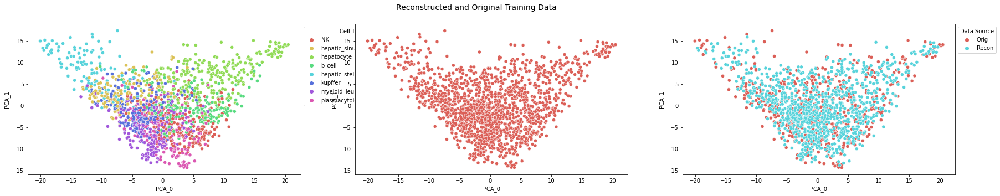

In [112]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

(2000, 2)
(2000, 2)


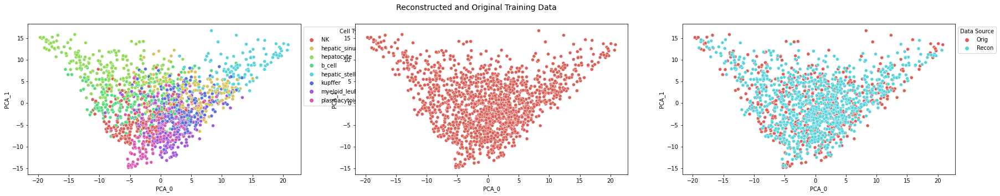

In [115]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

(2000, 2)
(2000, 2)


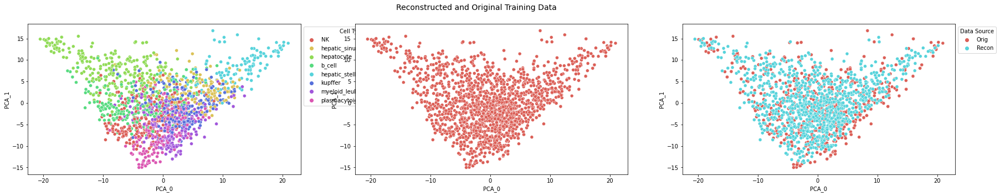

In [116]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)